This crops out just the ROI with no margin at the ROI's actual size. This may be useful for training a sliding window ROI detector.

In [1]:
import PIL
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import os
import random
import shutil
import re
from scipy.misc import imresize
from mammo_utils import create_mask, half_image, get_fuzzy_offset, progress, rename_and_copy_files
%matplotlib inline

In [9]:
## for the masks that are too big we are going to attempt to slice it into four slices, one for each corner.
## this function makes sure that the corners don't run off the image
def check_slice_corners(image_slice, full_image_arr, corners, slice_size=299):
    h, w = image_slice.shape
    image_h, image_w = full_image_arr.shape
    
    # if the slice is the right shape return it
    if (h == slice_size) & (w == slice_size) and (np.mean(image_slice) > 25):
        return image_slice
    
    # else try to reframe it by checking each corner
    else:
        if corners[0] < 0:
            corners[0] = 0
            corners[1] = slice_size
        elif corners[1] > image_h:
            corners[1] = image_h
            corners[0] = image_h - slice_size
        
        if corners[2] < 0:
            corners[2] = 0
            corners[3] = slice_size
        elif corners[3] > image_w:
            corners[3] = image_w
            corners[2] = image_w - slice_size
            
        image_slice = full_image_arr[corners[0]:corners[1],corners[2]:corners[3]]
        
        # check that the slice contains useable info and doesn't just contain empty space
        if (np.mean(image_slice) > 25):
            return image_slice
    
    # else there is a problem, return an unusable array
    return np.array([0]).reshape((1,1))

## remove extraneous characters from end of file name and return it
def clean_name(name):
    patient_id = re.findall("(P_[\d]+)_", name)
    if len(patient_id) > 0:
        patient_id = patient_id[0]
    else:
        print("Name error")
        return name

    image_side = re.findall("_(LEFT|RIGHT)_", name)

    if len(image_side) > 0:
        image_side = image_side[0]
    else:
        print("Side error")
        return name

    image_type = re.findall("(CC|MLO)", name)
    if len(image_type) > 0:
        image_type = image_type[0]
    else:
        return name
    
    return patient_id + "_" + image_side + "_" + image_type

## randomly rotate an image
def random_rotate_image(img):
    rotations = np.random.randint(low=-4, high=3)
    return np.rot90(img, rotations)

## randomly flip an image left-right, up-down or both and return it
def random_flip_image(img):
    fliplr = np.random.binomial(1,0.5)
    flipud = np.random.binomial(1,0.5)
    
    if fliplr:
        img = np.flip(img, 1)
    if flipud:
        img = np.flip(img, 0)
        
    return random_rotate_image(img)


def get_roi_edges(center_col, center_row, img_height, img_width, fuzz_offset_w=0, fuzz_offset_h=0, scale_factor=1, slice_size=299):
    # slice margin
    slice_margin = slice_size // 3
    
    # figure out the new center of the ROI
    center_col_scaled = int(center_col * scale_factor)
    center_row_scaled = int(center_row * scale_factor)
    
    start_col = center_col_scaled - slice_margin + fuzz_offset_h
    end_col = start_col + slice_size
    
    if start_col < 0:
        start_col = 20
        end_col = start_col + slice_size
    elif end_col > (img_width - 20):
        end_col = img_width - 20
        start_col = end_col - slice_size
        
    start_row = center_row_scaled - slice_margin + fuzz_offset_w
    end_row = start_row + slice_size
    
    if start_row < 0:
        start_row = 20
        end_row = start_row + slice_size
    elif end_row > (img_height - 20):
        end_row = img_height - 20
        start_row = end_row - slice_size           
     
    return start_row, end_row, start_col, end_col

## cut out tiles from images given the ROI center and size, with padding, random offset and random rotation
def extract_slice(img, center_col, center_row, roi_size, padding=1.2, context_scale=2, return_slice_size=299):
    # figure out the size of the tile we will extract
    tile_size = int(roi_size * context_scale)
    
    # if the tile is very small enlarge it so we don't zoom too much and distort the images
    if tile_size < 300:
        tile_size = 300
    
    # get random offset
    fuzz_offset_h, fuzz_offset_w = get_fuzzy_offset(int(roi_size * padding), slice_size=tile_size)
    
    # define boundaries for the abnormality
    image_h = img.shape[0]
    image_w = img.shape[1]
    start_row, end_row, start_col, end_col = get_roi_edges(center_col, center_row, image_h, image_w, fuzz_offset_w, fuzz_offset_h, 1, slice_size=tile_size)
    
    # slice the ROI out of the image
    img_slice = img[start_row:end_row, start_col:end_col]

    # cut the slice down to proper size
    try:
        img_slice = imresize(img_slice, (return_slice_size,return_slice_size))
    except:
        print("Error resizing tile")
        return np.array([1,1])
    
    # if everything is usable return it, otherwise return an unusable slice
    if img_slice.shape == (return_slice_size,return_slice_size):
        return random_flip_image(img_slice.reshape(return_slice_size,return_slice_size,1))
    else:
        return np.array([1,1])
    
    

## function to create ROI slices from masks and full images
## inputs: mask_dir and image_dir - paths to directories containing respective images
##         slice_size - size of slices to create
##         output - if True will output each file processed, 
##                  if False will only output errors and warnings, 
##                  if None won't ouput anything
## returns: numpy array of images and list of corresponding file names
def create_roi_slices(mask_dir, image_dir, slice_size=299, output=True):
    # loop through mask directory
    mask_files = os.listdir(mask_dir)
    slices_list = []
    image_names_list = []
    full_slice_size = slice_size * 2
    roi_sizes = []
    
    counter = 0
    if output is None:
        progress(counter, len(mask_files), 'WORKING')
    
    for mask in mask_files:
        # create a progress bar
        counter += 1
        if output is None:
            progress(counter, len(mask_files), mask)
        
        if output:
            print(mask)
        
        # get the base file name from the mask name
        base_image_file = clean_name(mask)
        image_file = base_image_file + "_FULL.jpg"
        
        # try to open the image, if it doesn't exist continue
        try:
            full_image = PIL.Image.open(image_dir + "/" + image_file)
        except:
            try:
                full_image = PIL.Image.open(image_dir + "/" + base_image_file + "000000.jpg")
            except:
                try:
                    full_image = PIL.Image.open(image_dir + "/" + base_image_file + "000001.jpg")
                except:
                    print("Error FileNotFound:", base_image_file)
                    continue       
        
        # turn it into an array
        full_image_arr = np.array(full_image)
        
        # get rid of the extra dimensions with unneccessary info
        full_image_arr = full_image_arr[:,:,0]
        
        # get the mask, if the mask is bigger than the slice we will create multiple slices using the corners of the mask. 
        center_row, center_col, too_big, full_image_arr, mask_size = create_mask(mask_dir + "/" + mask, full_image_arr, half=False, output=output)
        
        # get some info we will need later
        image_h, image_w = full_image_arr.shape
        try:
            mask_height = mask_size[0]
            mask_width = mask_size[1]
            roi_size = np.max([mask_height, mask_width])
            if output:
                print("Mask", mask, " Height:", mask_height, "Width:", mask_width)
        except:
            print("Mask Size Error:", mask_size, "for", mask)
            
        # if there is a problem then skip this one
        if (center_row == 0) and (center_col == 0):
            print("Error, skipping", mask)
            continue
        
        # define boundaries for the abnormality
        start_row = center_row - (roi_size // 2)
        if start_row < 0:
            start_row = 0
            
        end_row = start_row + roi_size
        if end_row > image_h:
            end_row = image_h
            start_row = end_row - roi_size
        
        start_col = center_col - (roi_size // 2)
        if start_col < 0:
            start_col = 0
        
        end_col = start_col + roi_size
        if end_col > image_w:
            end_col = image_w
            start_col = end_col - roi_size
        
        # slice the ROI out of the image
        img_slice = full_image_arr[start_row:end_row, start_col:end_col]

        # cut the slice down to half size
        img_slice = imresize(img_slice, (slice_size,slice_size))

        # if the slice is the right shape add it to the list
        if img_slice.shape == (slice_size,slice_size):
            slices_list.append(random_flip_image(img_slice.reshape(slice_size,slice_size,1)))
            image_names_list.append(base_image_file + ".jpg")
            roi_sizes.append(roi_size)
        elif output is not None:
            print("Actual size slice is wrong shape", mask)
            
            
    return np.array(slices_list), image_names_list, roi_sizes

## Mass Train

In [11]:
# copy all of the masks into one directory, renaming them appropriately
rename_and_copy_files("D:\\Documents\\Mammography\\CBIS-DDSM\\", "Mass Train ROI JPEGs", "Mass Train All Mask JPEGs Full 2", scan_type="MASK")
rename_and_copy_files("D:\\Documents\\Mammography\\CBIS-DDSM\\", "Mass Train JPEGs Full 2", "Mass Train All JPEGs Full", scan_type="FULL")

Error: Patient-Mass-Training_P_00779_LEFT_CC_1/Study_DDSM_MG[20160720]
Error: Patient-Mass-Training_P_01849_RIGHT_MLO_1/Study_DDSM_MG[20160720]


In [23]:
## go through the directories and crop out the ROI from the full image using the mask
mask_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Mass Train All Mask JPEGs Full"
image_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Mass Train All JPEGs Full"

## use a copy on the local drive to make this go faster
mask_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Mass Train All Mask JPEGs Full"
image_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Mass Train All JPEGs Full"

mass_train_slices, mass_train_image_names, mass_train_sizes = create_roi_slices(mask_dir, image_dir, output=None)

C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if issubdtype(ts, int):
C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


Error FileNotFound: P_00279_LEFT_MLO-------------------------] 13.8% ...P_00279_LEFT_MLO000000.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Train All Mask JPEGs Full/P_00423_RIGHT_CC_MASK.jpg
Mask Size Error: 0 for P_00423_RIGHT_CC_MASK.jpg
Error, skipping P_00423_RIGHT_CC_MASK.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Train All Mask JPEGs Full/P_00453_LEFT_CC_MASK.jpg
Mask Size Error: 0 for P_00453_LEFT_CC_MASK.jpg
Error, skipping P_00453_LEFT_CC_MASK.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Train All Mask JPEGs Full/P_00687_LEFT_CC_MASK.jpg
Mask Size Error: 0 for P_00687_LEFT_CC_MASK.jpg
Error, skipping P_00687_LEFT_CC_MASK.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Train All Mask JPEGs Full/P_00687_LEFT_MLO

In [29]:
print("Mass Train Slices shape:",mass_train_slices.shape)
print("Mass Train File Name List:", len(mass_train_image_names))

print("Mean Mass Train ROI Size:", np.mean(mass_train_sizes))
print("Min Mass Train ROI Size:", np.min(mass_train_sizes))
print("Max Mass Train ROI Size:", np.max(mass_train_sizes))

Mass Train Slices shape: (1203, 299, 299, 1)
Mass Train File Name List: 1203
Mean Mass Train ROI Size: 357.96176226101414
Min Mass Train ROI Size: 119
Max Mass Train ROI Size: 1365


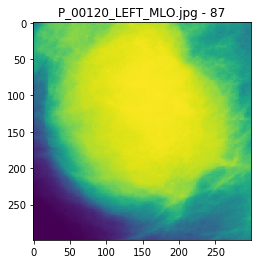

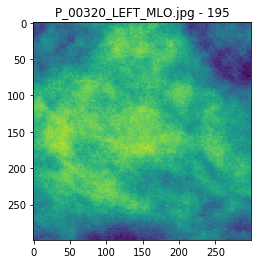

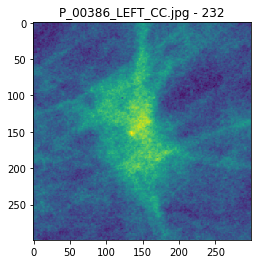

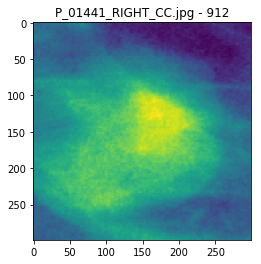

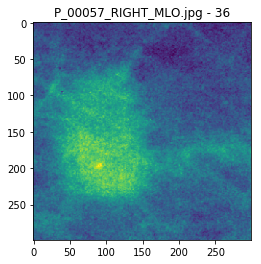

...

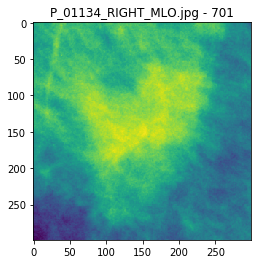

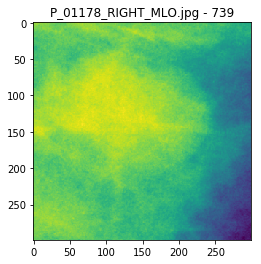

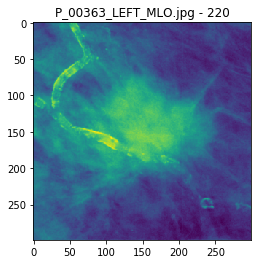

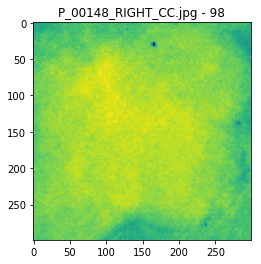

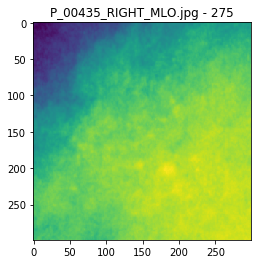

In [25]:
# get some random images
N = 20
idxs = random.sample(range(len(mass_train_slices)), k=N)

for idx in idxs:
    plt.imshow(mass_train_slices[idx].reshape(299,299))
    plt.title(mass_train_image_names[idx] + " - " + str(idx))
    plt.show()

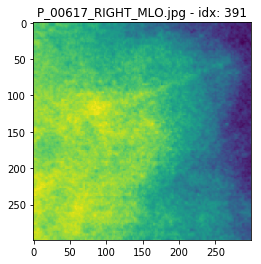

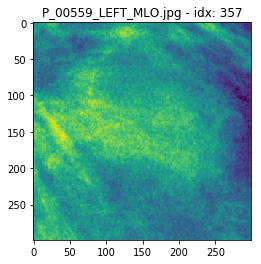

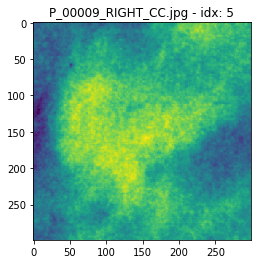

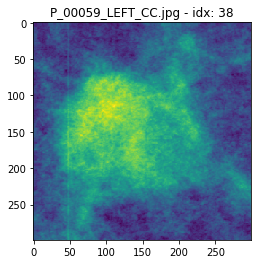

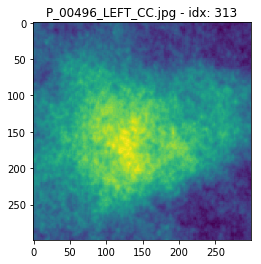

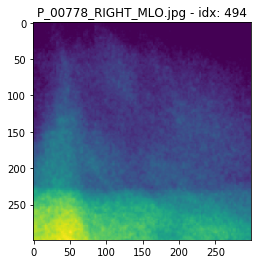

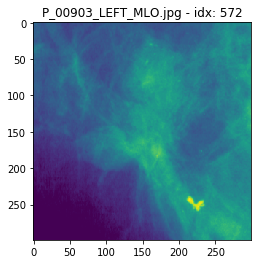

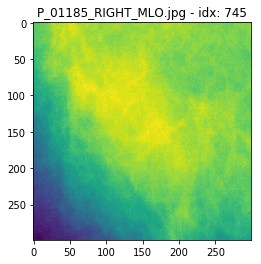

In [26]:
# look at some other images that have been transformed to make sure everything looks good
names_to_check = ["P_00617_RIGHT_MLO.jpg", "P_00559_LEFT_MLO.jpg", "P_00009_RIGHT_CC.jpg", "P_00059_LEFT_CC.jpg", "P_00496_LEFT_CC.jpg", "P_00778_RIGHT_MLO.jpg", "P_00903_LEFT_MLO.jpg", "P_01185_RIGHT_MLO.jpg"]
for name in names_to_check:
    for i in range(len(mass_train_image_names)):
        if mass_train_image_names[i] == name:
            plt.imshow(mass_train_slices[i].reshape(299,299))
            plt.title(name + " - idx: " + str(i))
            plt.show()

In [27]:
# process labels for slices
train_labels = pd.read_pickle(os.path.join("data", "train_labels.pkl"))
train_labels['IMAGE_NAME2'] = train_labels.index
train_labels = train_labels.drop_duplicates(['IMAGE_NAME2'])

#mass_train_image_names = np.load(os.path.join("data", "mass_train_filenames.npy"))
mass_train_labels = []

for image in mass_train_image_names:
    label = train_labels.loc[image]['CLASS']
    mass_train_labels.append(label)
    
mass_train_labels = np.array(mass_train_labels)
print("Mass Train Labels:", len(mass_train_labels))

Mass Train Labels: 1203


In [28]:
np.save(os.path.join("data", "mass_train_slices7.npy"), mass_train_slices)
np.save(os.path.join("data", "mass_train_filenames7.npy"), mass_train_image_names)
np.save(os.path.join("data", "mass_train_labels7.npy"), mass_train_labels)

## Calc Train

In [42]:
# copy all of the masks into one directory, renaming them appropriately
rename_and_copy_files("D:\\Documents\\Mammography\\CBIS-DDSM\\", "Calc Train ROI JPEGsl", "Calc Train All Mask JPEGs Full", scan_type="MASK")
rename_and_copy_files("D:\\Documents\\Mammography\\CBIS-DDSM\\", "Calc Train All JPEGs Full", "Calc Train All Full JPEGs", scan_type="FULL")

In [17]:
## go through the directories and crop out the ROI from the full image using the mask
mask_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Calc Train All Mask JPEGs Full"
image_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Calc Train All Full JPEGs"

## use a copy on the local drive to make this go faster
mask_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Calc Train All Mask JPEGs Full"
image_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Calc Train All Full JPEGs"

calc_train_slices, calc_train_image_names, calc_train_sizes = create_roi_slices(mask_dir, image_dir, output=None)

C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if issubdtype(ts, int):
C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


In [30]:
print("Calc Train Slices shape:",calc_train_slices.shape)
print("Calc Train File Name List:", len(calc_train_image_names))

print("Mean Calc Train ROI Size:", np.mean(calc_train_sizes))
print("Min Calc Train ROI Size:", np.min(calc_train_sizes))
print("Max Calc Train ROI Size:", np.max(calc_train_sizes))

Calc Train Slices shape: (1227, 299, 299, 1)
Calc Train File Name List: 1227
Mean Calc Train ROI Size: 544.7302363488183
Min Calc Train ROI Size: 41
Max Calc Train ROI Size: 3801


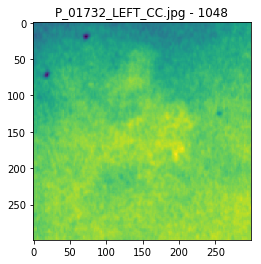

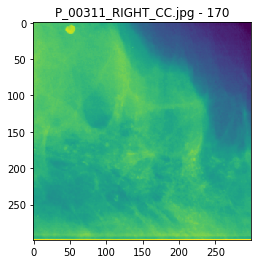

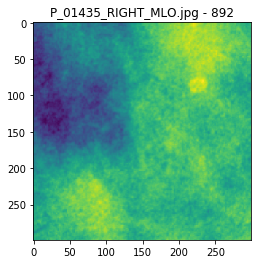

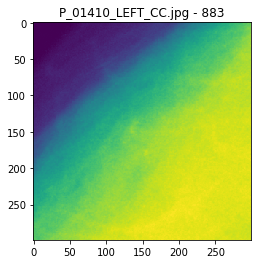

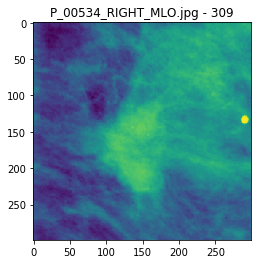

...

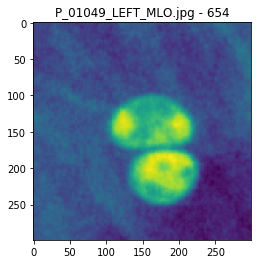

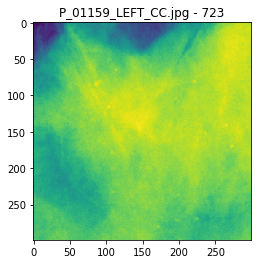

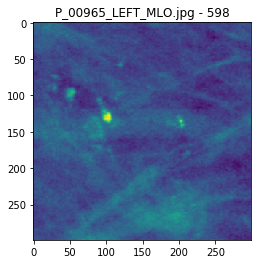

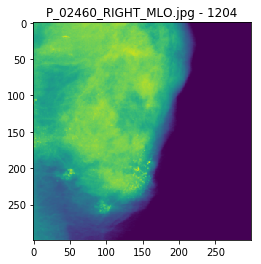

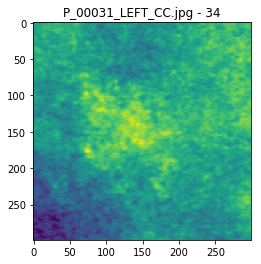

In [19]:
# get some random images
N = 20
idxs = random.sample(range(len(calc_train_slices)), k=N)

for idx in idxs:
    plt.imshow(calc_train_slices[idx].reshape(299,299))
    plt.title(calc_train_image_names[idx] + " - " + str(idx))
    plt.show()

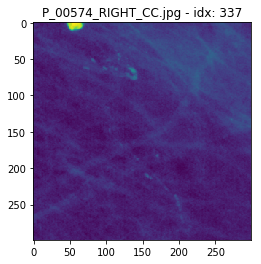

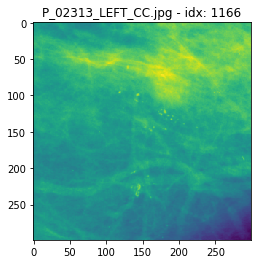

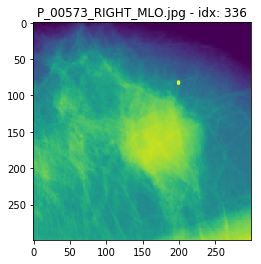

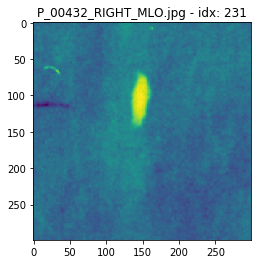

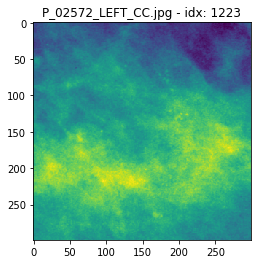

...

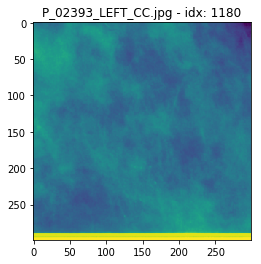

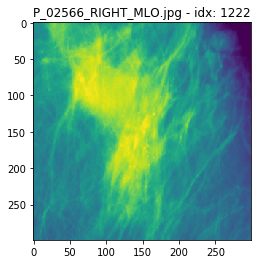

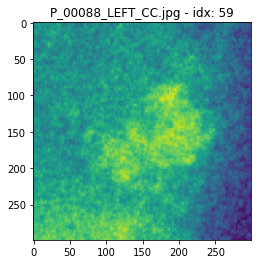

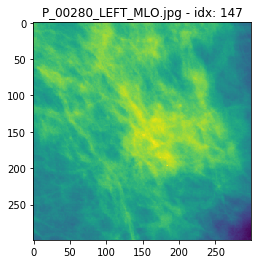

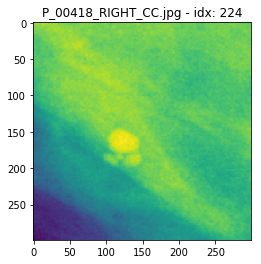

In [20]:
images_to_check = ["P_00574_RIGHT_CC.jpg","P_02313_LEFT_CC.jpg","P_00573_RIGHT_MLO.jpg","P_00432_RIGHT_MLO.jpg","P_02572_LEFT_CC.jpg","P_00683_RIGHT_MLO.jpg","P_02393_LEFT_CC.jpg","P_02566_RIGHT_MLO.jpg","P_00088_LEFT_CC.jpg","P_00280_LEFT_MLO.jpg","P_00418_RIGHT_CC.jpg"]

for name in images_to_check:
    for i in range(len(calc_train_image_names)):
        if calc_train_image_names[i] == name:
            plt.imshow(calc_train_slices[i].reshape(299,299))
            plt.title(name + " - idx: " + str(i))
            plt.show()

In [21]:
calc_train_labels = []
train_labels = pd.read_pickle(os.path.join("data", "train_labels.pkl"))
train_labels['IMAGE_NAME2'] = train_labels.index
train_labels = train_labels.drop_duplicates(['IMAGE_NAME2'])

#calc_train_image_names = np.load("data/calc_train_filenames.npy")

for image in calc_train_image_names:
    calc_train_labels.append(train_labels.loc[image]['CLASS'])
    
print("Calc Train Labels:", len(calc_train_labels))

Calc Train Labels: 1227


In [22]:
np.save(os.path.join("data", "calc_train_slices7.npy"), calc_train_slices)
np.save(os.path.join("data", "calc_train_filenames7.npy"), calc_train_image_names)
np.save(os.path.join("data", "calc_train_labels7.npy"), np.array(calc_train_labels))

## Mass Test

In [5]:
# copy all of the masks into one directory, renaming them appropriately
rename_and_copy_files("E:\\Documents\\Mammography\\CBIS-DDSM\\", "Mass Test ROI JPEGs", "Mass Test All Mask JPEGs", scan_type="MASK")
rename_and_copy_files("E:\\Documents\\Mammography\\CBIS-DDSM\\", "Mass Test Full JPEGs", "Mass Test All Full JPEGs", scan_type="FULL")

In [10]:
## go through the directories and crop out the ROI from the full image using the mask
mask_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Mass Test All Mask JPEGs"
image_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Mass Test All Full JPEGs"

## use a copy on the local drive to make testing faster
mask_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Mass Test All Mask JPEGs"
image_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Mass Test All Full JPEGs"

mass_test_slices, mass_test_image_names, mass_test_sizes = create_roi_slices(mask_dir, image_dir, output=None)

C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if issubdtype(ts, int):
C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Test All Mask JPEGs/P_00145_LEFT_CC_MASK.jpg
Mask Size Error: 0 for P_00145_LEFT_CC_MASK.jpg
Error, skipping P_00145_LEFT_CC_MASK.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Test All Mask JPEGs/P_00145_LEFT_MLO_MASK.jpg
Mask Size Error: 0 for P_00145_LEFT_MLO_MASK.jpg
Error, skipping P_00145_LEFT_MLO_MASK.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Test All Mask JPEGs/P_00379_LEFT_MLO_MASK.jpg
Mask Size Error: 0 for P_00379_LEFT_MLO_MASK.jpg
Error, skipping P_00379_LEFT_MLO_MASK.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Mass Test All Mask JPEGs/P_00381_LEFT_CC_MASK.jpg
Mask Size Error: 0 for P_00381_LEFT_CC_MASK.jpg
Error, skipping P_00381_LEFT_CC_MASK.jpg
Mask shape doesn't mat

In [31]:
print("Mass Test Slices shape:", mass_test_slices.shape)
print("Mass Test File Name List:", len(mass_test_image_names))

print("Mean Mass Test ROI Size", np.mean(mass_test_sizes))
print("Min Mass Test ROI Size", np.min(mass_test_sizes))
print("Max Mass Test ROI Size", np.max(mass_test_sizes))

Mass Test Slices shape: (355, 299, 299, 1)
Mass Test File Name List: 355
Mean Mass Test ROI Size 348.8929577464789
Min Mass Test ROI Size 142
Max Mass Test ROI Size 948


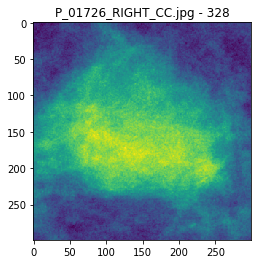

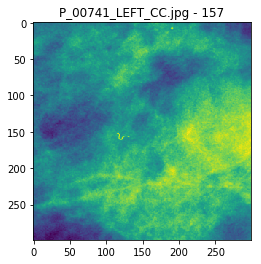

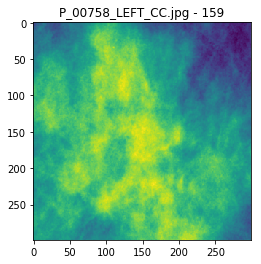

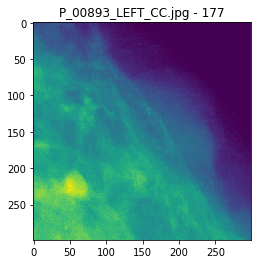

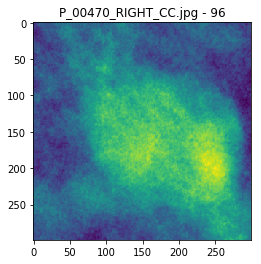

...

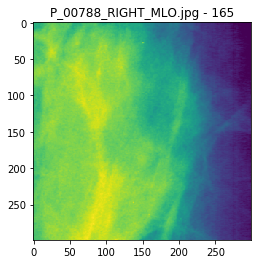

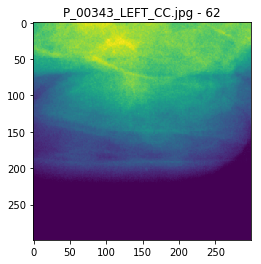

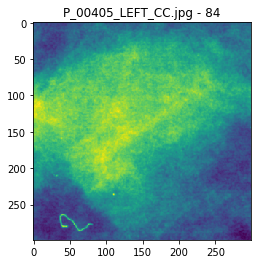

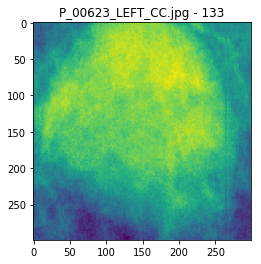

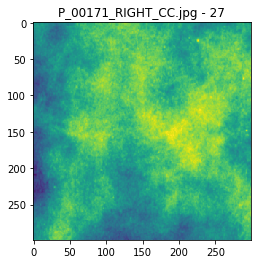

In [12]:
# get some random images
N = 20
idxs = random.sample(range(len(mass_test_slices)), k=N)

for idx in idxs:
    plt.imshow(mass_test_slices[idx].reshape(299,299))
    plt.title(mass_test_image_names[idx] + " - " + str(idx))
    plt.show()

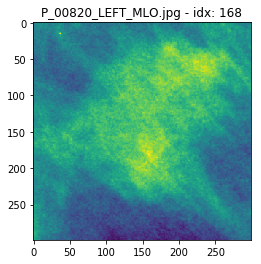

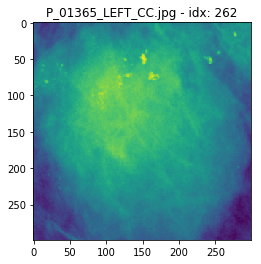

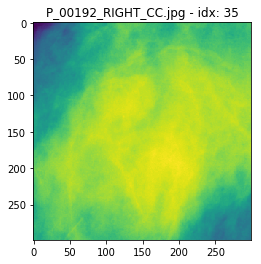

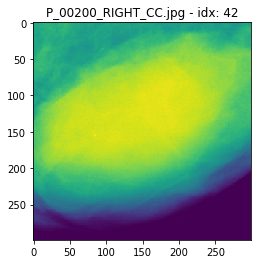

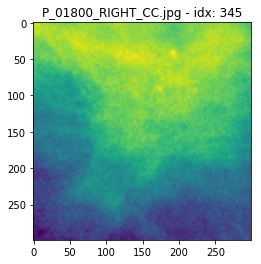

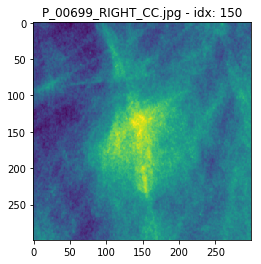

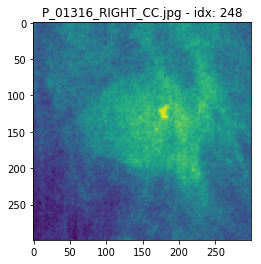

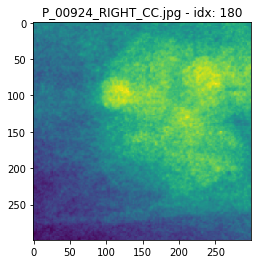

In [13]:
images_to_check = ["P_00820_LEFT_MLO.jpg","P_01365_LEFT_CC.jpg","P_00192_RIGHT_CC.jpg","P_00200_RIGHT_CC.jpg","P_01800_RIGHT_CC.jpg", "P_00699_RIGHT_CC.jpg", "P_01316_RIGHT_CC.jpg", "P_00924_RIGHT_CC.jpg"]

for name in images_to_check:
    for i in range(len(mass_test_image_names)):
        if mass_test_image_names[i] == name:
            plt.imshow(mass_test_slices[i].reshape(299,299))
            plt.title(name + " - idx: " + str(i))
            plt.show()

In [14]:
# process labels for slices
test_labels = pd.read_pickle(os.path.join("data", "test_labels.pkl"))

test_labels['IMAGE_NAME2'] = test_labels.index
test_labels = test_labels.drop_duplicates(['IMAGE_NAME2'])
mass_test_labels = []

for image in mass_test_image_names:
    label = test_labels.loc[image]['CLASS']
    mass_test_labels.append(test_labels.loc[image]['CLASS'])
    
print("Mass Test Labels:", len(mass_test_labels))

Mass Test Labels: 355


In [15]:
np.save(os.path.join("data", "mass_test_slices7.npy"), mass_test_slices)
np.save(os.path.join("data", "mass_test_filenames7.npy"), mass_test_image_names)
np.save(os.path.join("data", "mass_test_labels7.npy"), np.array(mass_test_labels))

## Calc Test

In [6]:
# copy all of the masks into one directory, renaming them appropriately
rename_and_copy_files("E:\\Documents\\Mammography\\CBIS-DDSM\\", "Calc Test ROI JPEGs", "Calc Test All Mask JPEGs", scan_type="MASK")
rename_and_copy_files("E:\\Documents\\Mammography\\CBIS-DDSM\\", "Calc Test Full JPEGs", "Calc Test All Full JPEGs", scan_type="FULL")

In [3]:
## go through the directories and crop out the ROI from the full image using the mask
mask_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Calc Test All Mask JPEGs"
image_dir = "E:\\Documents\\Mammography\\CBIS-DDSM\\Calc Test All Full JPEGs"

## use a copy on the local drive to make testing faster
mask_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Calc Test All Mask JPEGs"
image_dir = "C:\\Users\\eric\\Documents\\Courses\\Applied ML 2\\mammography\\data\\cbis-ddsm\\Calc Test All Full JPEGs"

calc_test_slices, calc_test_image_names, calc_roi_size = create_roi_slices(mask_dir, image_dir, output=None)

C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if issubdtype(ts, int):
C:\Users\eric\Anaconda2\envs\exts-aml2\lib\site-packages\scipy\misc\pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Calc Test All Mask JPEGs/P_01217_RIGHT_CC000001_1.jpg
Mask Size Error: 0 for P_01217_RIGHT_CC000001_1.jpg
Error, skipping P_01217_RIGHT_CC000001_1.jpg
Mask shape doesn't match image! C:\Users\eric\Documents\Courses\Applied ML 2\mammography\data\cbis-ddsm\Calc Test All Mask JPEGs/P_01460_LEFT_MLO000001_2.jpg
Mask Size Error: 0 for P_01460_LEFT_MLO000001_2.jpg
Error, skipping P_01460_LEFT_MLO000001_2.jpg


In [4]:
print("Calc Test Slices shape:", calc_test_slices.shape)
print("Calc Test File Name List:", len(calc_test_image_names))

Calc Test Slices shape: (313, 299, 299, 1)
Calc Test File Name List: 313


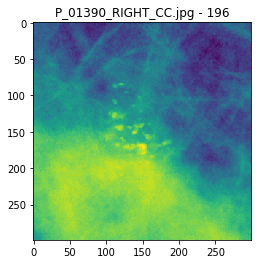

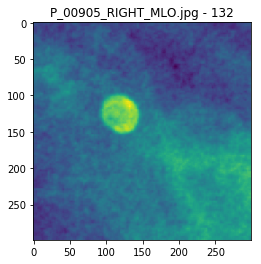

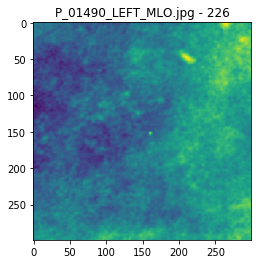

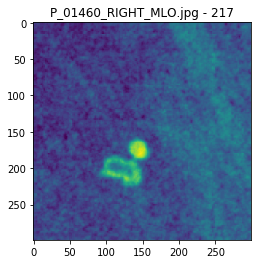

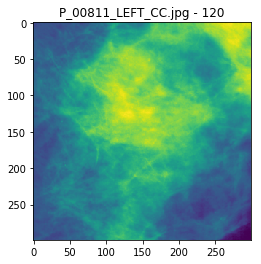

...

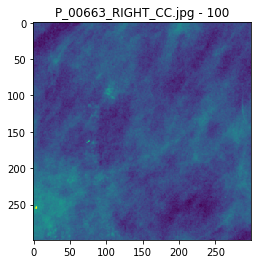

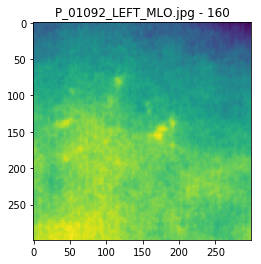

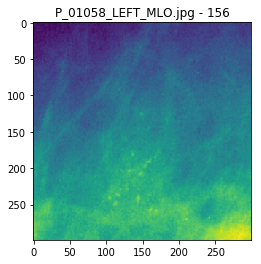

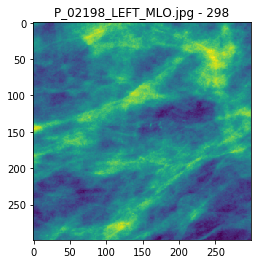

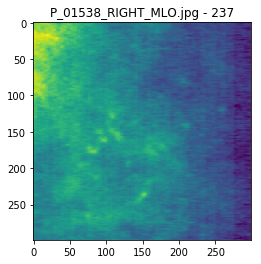

In [5]:
# get some random images to make sure everything looks good
N = 20
idxs = random.sample(range(len(calc_test_slices)), k=N)

for idx in idxs:
    plt.imshow(calc_test_slices[idx].reshape(299,299))
    plt.title(calc_test_image_names[idx] + " - " + str(idx))
    plt.show()

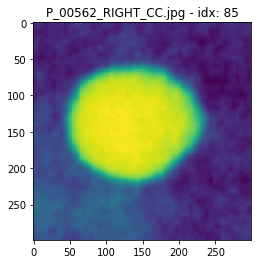

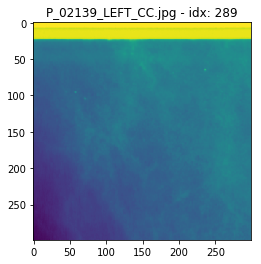

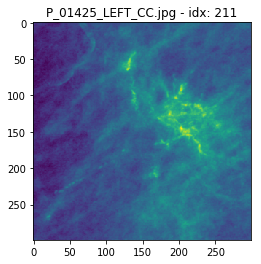

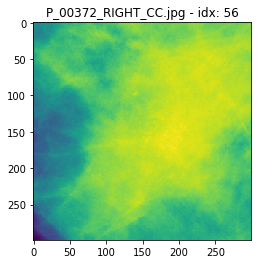

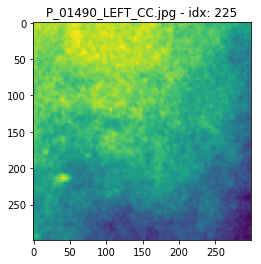

...

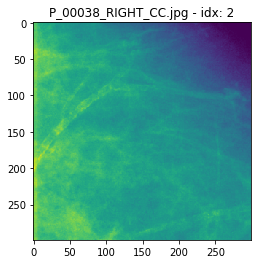

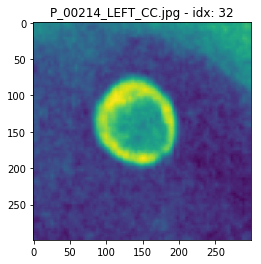

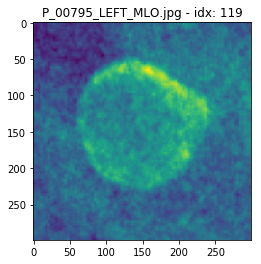

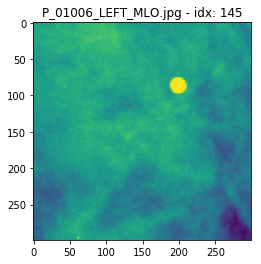

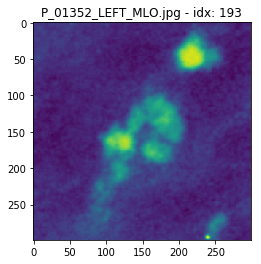

In [6]:
# check some specific images that have been identified as problematic
images_to_check = ["P_00562_RIGHT_CC.jpg","P_02139_LEFT_CC.jpg","P_01425_LEFT_CC.jpg","P_00372_RIGHT_CC.jpg","P_01490_LEFT_CC.jpg","P_00214_RIGHT_MLO.jpg","P_01502_LEFT_CC.jpg","P_01743_RIGHT_MLO.jpg","P_00041_LEFT_CC.jpg", "P_00038_RIGHT_CC.jpg", "P_00214_LEFT_CC.jpg", "P_00795_LEFT_MLO.jpg", "P_01006_LEFT_MLO.jpg", "P_01352_LEFT_MLO.jpg"]

for name in images_to_check:
    for i in range(len(calc_test_image_names)):
        if calc_test_image_names[i] == name:
            plt.imshow(calc_test_slices[i].reshape(299,299))
            plt.title(name + " - idx: " + str(i))
            plt.show()

In [7]:
test_labels = pd.read_pickle(os.path.join("data", "test_labels.pkl"))
test_labels['IMAGE_NAME2'] = test_labels.index
test_labels = test_labels.drop_duplicates(['IMAGE_NAME2'])

calc_test_labels = []
for image in calc_test_image_names:
    label = test_labels.loc[image]['CLASS']
    calc_test_labels .append(test_labels.loc[image]['CLASS'])
    
print("Calc Test Labels:", len(calc_test_labels))

Calc Test Labels: 313


In [8]:
np.save(os.path.join("data", "calc_test_slices7.npy"), calc_test_slices)
np.save(os.path.join("data", "calc_test_filenames7.npy"), calc_test_image_names)
np.save(os.path.join("data", "calc_test_labels7.npy"), np.array(calc_test_labels))

## Create File with All Slices

In [65]:
mass_train_labels = np.load(os.path.join("data", "mass_train_labels7.npy"))
mass_test_labels = np.load(os.path.join("data", "mass_test_labels7.npy"))
calc_train_labels = np.load(os.path.join("data", "calc_train_labels7.npy"))
calc_test_labels = np.load(os.path.join("data", "calc_test_labels7.npy"))

train_labels = np.concatenate([mass_train_labels,calc_train_labels,], axis=0)
test_labels = np.concatenate([mass_test_labels, calc_test_labels], axis=0)

In [66]:
mass_train_slices = np.load(os.path.join("data", "mass_train_slices7.npy"))
mass_test_slices = np.load(os.path.join("data", "mass_test_slices7.npy"))
calc_train_slices = np.load(os.path.join("data", "calc_train_slices7.npy"))
calc_test_slices = np.load(os.path.join("data", "calc_test_slices7.npy"))

train_slices = np.concatenate([mass_train_slices, calc_train_slices], axis=0)
test_slices = np.concatenate([mass_test_slices, calc_test_slices], axis=0)

In [67]:
mass_train_names = np.load(os.path.join("data", "mass_train_filenames7.npy"))
mass_test_names = np.load(os.path.join("data", "mass_test_filenames7.npy"))
calc_train_names = np.load(os.path.join("data", "calc_train_filenames7.npy"))
calc_test_names = np.load(os.path.join("data", "calc_test_filenames7.npy"))

train_names = np.concatenate([mass_train_names, calc_train_names], axis=0)
test_names = np.concatenate([mass_test_names, calc_test_names], axis=0)

In [68]:
print("Train labels:", train_labels.shape)
print("Train slices:", train_slices.shape)
print("Train filenames:", train_names.shape)

print("Test labels:", test_labels.shape)
print("Test slices:", test_slices.shape)
print("Test filenames:", test_names.shape)

Train labels: (10191,)
Train slices: (10191, 299, 299, 1)
Train filenames: (10191,)
Test labels: (2569,)
Test slices: (2569, 299, 299, 1)
Test filenames: (2569,)


In [69]:
np.save(os.path.join("data", "cbis_train_slices.npy"), train_slices)
np.save(os.path.join("data", "cbis_train_labels.npy"), train_labels)
np.save(os.path.join("data", "cbis_train_names.npy"), train_names)

np.save(os.path.join("data", "cbis_test_slices.npy"), test_slices)
np.save(os.path.join("data", "cbis_test_labels.npy"), test_labels)
np.save(os.path.join("data", "cbis_test_names.npy"), test_names)

## Mask Sizes

The MIAS scans are sized 1024x1024 so have been scaled down. The DDSM images are full size and the regions of interest have been cut out of them at full size. We know the radius of the MIAS abnormalities, if we can get an average radius of DDSM abnormalities we can scale the MIAS data so that the sizes will match.

In [2]:
def get_mask_sizes(mask_dir, output=True):
    # loop through mask directory
    mask_files = os.listdir(mask_dir)
    mask_sizes = []
    
    for mask in mask_files:
        if output:
            print(mask)
        
        # get the mask, if the mask is bigger than the slice we will create multiple slices 
        # using the corners of the mask. 
        center_row, center_col, too_big, _, mask_size = create_mask(mask_dir + "/" + mask, np.array([0]).reshape(1,1))
        mask_sizes.append(mask_size)
        
    return mask_sizes

In [3]:
## get the sizes of the masks as this will be used to scale the MIAS data properly
mask_dir = "D:\\Documents\\Mammography\\CBIS-DDSM\\Mass Train All Mask JPEGs Full"

mass_train_mask_sizes = get_mask_sizes(mask_dir, output=False)

In [13]:
print("Mean ROI Radius Mass Train Data:", np.mean(mass_train_mask_sizes))
print("Median ROI Radius Mass Train Data:", np.median(mass_train_mask_sizes))
print("Min ROI Radius Mass Train Data:", np.min(mass_train_mask_sizes))
print("Max ROI Radius Mass Train Data:", np.max(mass_train_mask_sizes))

Mean ROI Radius Mass Train Data: 176.38161106590724
Median ROI Radius Mass Train Data: 159.0
Min ROI Radius Mass Train Data: 56
Max ROI Radius Mass Train Data: 681


In [9]:
## go through the directories and crop out the ROI from the full image using the mask
mask_dir = "D:\\Documents\\Mammography\\CBIS-DDSM\\Calc Train All Mask JPEGs Full"

calc_train_mask_sizes = get_mask_sizes(mask_dir, output=False)

In [15]:
print("Mean ROI Radius Calc Train Data:", np.mean(calc_train_mask_sizes))
print("Median ROI Radius Calc Train Data:", np.median(calc_train_mask_sizes))
print("Min ROI Radius Calc Train Data:", np.min(calc_train_mask_sizes))
print("Max ROI Radius Calc Train Data:", np.max(calc_train_mask_sizes))

Mean ROI Radius Calc Train Data: 271.4922575387123
Median ROI Radius Calc Train Data: 184.0
Min ROI Radius Calc Train Data: 20
Max ROI Radius Calc Train Data: 1899


In [16]:
all_mask_sizes = np.concatenate([mass_train_mask_sizes, calc_train_mask_sizes], axis=0)
                                 
print("Mean ROI Radius All Train Data:", np.mean(all_mask_sizes))
print("Median ROI Radius All Train Data:", np.median(all_mask_sizes))
print("Min ROI Radius All Train Data:", np.min(all_mask_sizes))
print("Max ROI Radius All Train Data:", np.max(all_mask_sizes))

Mean ROI Radius All Train Data: 223.89820846905536
Median ROI Radius All Train Data: 167.0
Min ROI Radius All Train Data: 20
Max ROI Radius All Train Data: 1899


<b>Compare to MIAS Data:</b><br>
Mean abnormality radius: 50.57657657657658<br>
Median abnormality radius: 41.0<br>
Min abnormality radius: 3.0<br>
Max abnormality radius: 197.0<br>

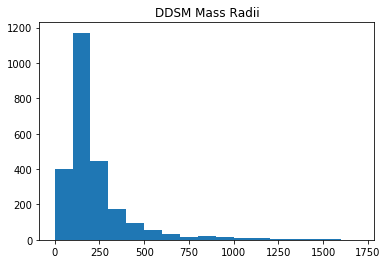

In [19]:
plt.hist(all_mask_sizes, bins=range(0, 1750, 100))
plt.title("DDSM Mass Radii")
plt.show()

<b>Compare to MIAS Radii</b>
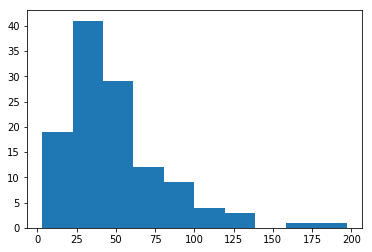

I am going to use an estimate of four to convert from the MIAS to DDSM data, as far as abnormality radii, so the MIAS data slices will be zoomed in by 4x to make them equivalent to the DDSM slices.

## Code Backup

In [ ]:
## function to create ROI slices from masks and full images
## inputs: mask_dir and image_dir - paths to directories containing respective images
##         slice_size - size of slices to create
##         output - if True will output each file processed, 
##                  if False will only output errors and warnings, 
##                  if None won't ouput anything
## returns: numpy array of images and list of corresponding file names
def create_roi_slices(mask_dir, image_dir, slice_size=299, output=True):
    # loop through mask directory
    mask_files = os.listdir(mask_dir)
    slices_list = []
    image_names_list = []

    for mask in mask_files:
        if output:
            print(mask)
        
        # get the base file name from the mask name
        base_image_file = clean_name(mask)
        image_file = base_image_file + "_FULL.jpg"
        
        # try to open the image, if it doesn't exist continue
        try:
            full_image = PIL.Image.open(image_dir + "/" + image_file)
        except:
            try:
                full_image = PIL.Image.open(image_dir + "/" + base_image_file + "000000.jpg")
            except:
                try:
                    full_image = PIL.Image.open(image_dir + "/" + base_image_file + "000001.jpg")
                except:
                    print("Error FileNotFound:", base_image_file)
                    continue       
        
        # scale the full image to half size
        full_image = half_image(full_image)
        image_h, image_w = full_image.size
        
        # turn it into an array
        full_image_arr = np.array(full_image)
        
        # get rid of the extra dimensions with unneccessary info
        full_image_arr = full_image_arr[:,:,0]
        
        # get the mask, if the mask is bigger than the slice we will create multiple slices using the corners of the mask. 
        center_row, center_col, too_big, full_image_arr, mask_size = create_mask(mask_dir + "/" + mask, full_image_arr)
        
        # get some info we will need later
        image_h, image_w = full_image_arr.shape
        try:
            mask_height = mask_size[0]
            mask_width = mask_size[1]
            roi_size = np.max([mask_height, mask_width])
        except:
            print("Mask Size Error:", mask_size, "for", mask)
            
        # if there is a problem then skip this one
        if (center_row == 0) and (center_col == 0):
            print("Error, skipping", mask)
            continue
        
        ## Do some data augmentation to have more training data
        
        # if the ROI will fit in a slice with a small margin on either side do that
        if roi_size <= (slice_size - 30) and not too_big:
            fuzz_offset_h, fuzz_offset_w = get_fuzzy_offset(roi_size)
            
            # define boundaries for the abnormality
            start_row, end_row, start_col, end_col = get_roi_edges(center_col, center_row, image_h, image_w, fuzz_offset_w, fuzz_offset_h, 1)
            
            # slice the ROI out of the image
            img_slice = full_image_arr[start_row:end_row, start_col:end_col]
            
            # if the slice is the right shape add it to the list
            if img_slice.shape == (slice_size,slice_size):
                slices_list.append(img_slice.reshape(slice_size,slice_size,1))
                image_names_list.append(base_image_file + ".jpg")
            elif output is not None:
                print("Normal slice is wrong shape", mask)
       
        # else if the ROI is too big we will zoom it out
        else:
            if output is not None:
                print("Zooming ROI out", mask)
                
            size_with_margin = roi_size + 60
            scale_factor = np.max([slice_size / size_with_margin, 0.8])
            zoom_height = int(image_h * scale_factor)
            zoom_width = int(image_w * scale_factor)
            size_scaled = roi_size * scale_factor
            
            # zoom the image out
            img_slice_2 = imresize(full_image_arr, (zoom_height, zoom_width))
            
            # get the offset
            fuzz_offset_h, fuzz_offset_w = get_fuzzy_offset(size_scaled)
            
            # get the center of the ROI
            center_col_zoom = center_col * scale_factor
            center_row_zoom = center_row * scale_factor
            
            start_row_zoom, end_row_zoom, start_col_zoom, end_col_zoom = get_roi_edges(center_col_zoom, center_row_zoom, zoom_height, zoom_width, fuzz_offset_w, fuzz_offset_h,scale_factor)
            
            # cut the slice out
            img_slice_2 = img_slice_2[start_row_zoom:end_row_zoom, start_col_zoom:end_col_zoom]
            
            # if it's the right size append it to the list
            if img_slice_2.shape == (slice_size,slice_size) and (np.mean(img_slice_2) > 20):
                slices_list.append(img_slice_2.reshape(slice_size,slice_size,1))
                image_names_list.append(base_image_file + ".jpg")
            elif output is not None:
                print("Zoomed out slice is wrong shape", mask)
            
            ## We will also take slices with the edges of the ROI
            mask_too_high = mask_height > (slice_size + 10)
            mask_too_wide = mask_width > (slice_size + 10)
            
            # let's create the set of corners for each slice
            if
            first_row = center_row - (mask_height // 2) + 15
            last_row = center_row + mask_height
            
            first_col = center_col - (mask_width // 2) + 15
            last_col = center_col + mask_width
            
            slice_1_corners = [first_row, first_row + slice_size, first_col, first_col+slice_size]
            slice_2_corners = [first_row, first_row + slice_size, last_col - slice_size, last_col]
            slice_3_corners = [last_row - slice_size, last_row, first_col,first_col + slice_size]
            slice_4_corners = [last_row - slice_size, last_row, last_col - slice_size, last_col]
            
            # now let's cut the ROI into up to four slices so that each contains an edge
            if mask_too_wide:
                full_image_slice_1 = full_image_arr[first_row:first_row+slice_size,first_col:first_col+slice_size]
                full_image_slice_2 = full_image_arr[first_row:first_row+slice_size,last_col-slice_size:last_col]
                
                # check the shape of the slices
                full_image_slice_1 = check_slice_corners(full_image_slice_1, full_image_arr, slice_1_corners)
                full_image_slice_2 = check_slice_corners(full_image_slice_2, full_image_arr, slice_2_corners)
                
                # if the slices are the right shape add them
                if full_image_slice_1.shape == (slice_size, slice_size) and (np.mean(full_image_slice_1) > 35):
                    slices_list.append(full_image_slice_1.reshape(slice_size,slice_size,1))
                    image_names_list.append(base_image_file + ".jpg")
                elif output is not None:
                    print("Slice 1 is wrong shape", mask)
                
                if full_image_slice_2.shape == (slice_size, slice_size) and (np.mean(full_image_slice_2) > 35):
                    slices_list.append(full_image_slice_2.reshape(slice_size,slice_size,1))
                    image_names_list.append(base_image_file + ".jpg")
                elif output is not None:
                    print("Slice 2 is wrong shape", mask)
                
            if mask_too_high:
                full_image_slice_3 = full_image_arr[last_row-slice_size:last_row,first_col:first_col+slice_size]
                full_image_slice_4 = full_image_arr[last_row-slice_size:last_row,last_col-slice_size:last_col]            
                
                # check the shapes
                full_image_slice_3 = check_slice_corners(full_image_slice_3, full_image_arr, slice_3_corners)
                full_image_slice_4 = check_slice_corners(full_image_slice_4, full_image_arr, slice_4_corners)
                
                # if the slices are the right shape add them
                if full_image_slice_3.shape == (slice_size, slice_size) and (np.mean(full_image_slice_3) > 35):
                    slices_list.append(full_image_slice_3.reshape(slice_size,slice_size,1))
                    image_names_list.append(base_image_file + ".jpg")
                elif output is not None:
                    print("Slice 3 is wrong shape", mask)
                
                if full_image_slice_4.shape == (slice_size, slice_size) and (np.mean(full_image_slice_4) > 35):
                    slices_list.append(full_image_slice_4.reshape(slice_size,slice_size,1))
                    image_names_list.append(base_image_file + ".jpg")
                elif output is not None:
                    print("Slice 4 is wrong shape", mask)
        
        # if the ROI is small zoom it in
        if roi_size <= 150:
            if output is not None:
                print("Zooming ROI in", mask)
            
            # slice out the ROI with fuzz factor set to 150
            fuzz_offset_h, fuzz_offset_w = get_fuzzy_offset(130)
            
            # define boundaries for the abnormality
            start_row, end_row, start_col, end_col = get_roi_edges(center_col, center_row, image_h, image_w, fuzz_offset_w, fuzz_offset_h, 1)
            
            # slice the ROI out of the image
            img_slice_full = full_image_arr[start_row:end_row, start_col:end_col]
            
            # now we will resize the slice to size and a half
            img_slice_full = imresize(img_slice_full, (int(slice_size*1.5), int(slice_size*1.5)))
            
            # now we will trim it back down to 299x299, with 25 pixel random offset on either side
            start_row = np.random.randint(low=35, high=60)
            start_col = np.random.randint(low=35, high=60)
            
            end_row = start_row + slice_size
            end_col = start_col + slice_size
            
            img_slice_3 = img_slice_full[start_row:end_row, start_col:end_col]
            
            #size_with_margin = roi_size + 60
            #scale_factor = np.max([299 / size_with_margin, 1.5])
            #zoom_height = int(image_h * scale_factor)
            #zoom_width = int(image_w * scale_factor)
            #size_scaled = roi_size * scale_factor
            
            # get the offset
            #fuzz_offset_h, fuzz_offset_w = get_fuzzy_offset(size_scaled)
            
            # get the center of the ROI
            #center_col_zoom = center_col * scale_factor
            #center_row_zoom = center_row * scale_factor
            
            #start_row_zoom, end_row_zoom, start_col_zoom, end_col_zoom = get_roi_edges(center_col_zoom, center_row_zoom, zoom_height, zoom_width, fuzz_offset_w, fuzz_offset_h,scale_factor)
            
            # cut the slice out
            #img_slice_3 = img_slice_3[start_row_zoom:end_row_zoom, start_col_zoom:end_col_zoom]
            
            # if it's the right size append it to the list
            if img_slice_3.shape == (slice_size,slice_size):
                slices_list.append(img_slice_3.reshape(slice_size,slice_size,1))
                image_names_list.append(base_image_file + ".jpg")
            elif output is not None:
                print("Zoomed in slice is wrong shape", mask)
            
        # of the ROI size is very small zoom it in some more
        
    return np.array(slices_list), image_names_list

## function to create ROI slices from masks and full images
## inputs: mask_dir and image_dir - paths to directories containing respective images
##         slice_size - size of slices to create
##         output - if True will output each file processed, 
##                  if False will only output errors and warnings, 
##                  if None won't ouput anything
## returns: numpy array of images and list of corresponding file names
def create_roi_slices(mask_dir, image_dir, slice_size=299, output=True):
    # loop through mask directory
    mask_files = os.listdir(mask_dir)
    slices_list = []
    image_names_list = []

    for mask in mask_files:
        if output:
            print(mask)
        
        # get the base file name from the mask name
        base_image_file = clean_name(mask)
        image_file = base_image_file + "_FULL.jpg"
        
        # try to open the image, if it doesn't exist continue
        try:
            full_image = PIL.Image.open(image_dir + "/" + image_file)
        except:
            try:
                full_image = PIL.Image.open(image_dir + "/" + base_image_file + "000000.jpg")
            except:
                try:
                    full_image = PIL.Image.open(image_dir + "/" + base_image_file + "000001.jpg")
                except:
                    print("Error FileNotFound:", base_image_file)
                    continue       
        
        # scale the full image to half size
        full_image = half_image(full_image)
        image_h, image_w = full_image.size
        
        # turn it into an array
        full_image_arr = np.array(full_image)
        
        # get rid of the extra dimensions with unneccessary info
        full_image_arr = full_image_arr[:,:,0]
        image_h, image_w = full_image_arr.shape
        
        # get the mask, if the mask is bigger than the slice we will create multiple slices using the corners of the mask. 
        center_row, center_col, too_big, full_image_arr, mask_size = create_mask(mask_dir + "/" + mask, full_image_arr)
        
        # if there is a problem then skip this one
        if (center_row == 0) and (center_col == 0):
            print("Error, skipping", mask)
            continue
        
        # if the ROI will fit in a slice with a small margin on either side do that
        if mask_size <= (slice_size - 30):
            
            
        # if the mask (with 20 pixel margin) will fit in one slice do that
        if not too_big:
            full_image_slice = full_image_arr[center_row-150:center_row+149,center_col-150:center_col+149]
            
        # otherwise if the mask is too big we are going to cut the ROI into multiple slices so each contains an edge
        else:
            if output is not None:
                print(mask, "Mask too big, reframing...")
                
            # get the height and width of the mask
            mask_height = center_row[1] - center_row[0]
            mask_width = center_col[1] - center_col[0]
            
            mask_too_high = mask_height > (slice_size + 10)
            mask_too_wide = mask_width > (slice_size + 10)
            
            # first let's size the abnormality down so it fits in one slice and use that as well
            mask_size = np.max([mask_height, mask_width])
            
            use_full_slice = False
            full_image_slice = full_image_arr[center_row[0] - 10:center_row[0] + mask_size,center_col[0] - 10:center_col[0] + mask_size]
            
            # if the slice isn't shaped right just ignore it, this isn't important enough to try to reshape it
            if full_image_slice.shape[0] == full_image_slice.shape[1]:
                try:
                    full_image_slice = imresize(full_image_slice, (slice_size,slice_size))
                    use_full_slice = True
                except:
                    use_full_slice = False
            
            # let's create the set of corners for each slice
            slice_1_corners = [center_row[0], center_row[0] + slice_size, center_col[0], center_col[0]+slice_size]
            slice_2_corners = [center_row[0], center_row[0] + slice_size, center_col[1] - slice_size, center_col[1]]
            slice_3_corners = [center_row[1] - slice_size, center_row[1], center_col[0], center_col[0] + slice_size]
            slice_4_corners = [center_row[1] - slice_size, center_row[1], center_col[1] - slice_size, center_col[1]]
            
            # now let's cut the ROI into up to four slices so that each contains an edge
            if mask_too_wide:
                full_image_slice_1 = full_image_arr[center_row[0]:center_row[0]+slice_size,center_col[0]:center_col[0]+slice_size]
                full_image_slice_2 = full_image_arr[center_row[0]:center_row[0]+slice_size,center_col[1]-slice_size:center_col[1]]
                
                # check the shape of the slices
                full_image_slice_1 = check_slice_corners(full_image_slice_1, full_image_arr, slice_1_corners)
                full_image_slice_2 = check_slice_corners(full_image_slice_2, full_image_arr, slice_2_corners)
            
            # if the mask is not too wide create slices that will fail the test and not be used
            else:
                full_image_slice_1 = np.array([0]).reshape(1,1)
                full_image_slice_2 = np.array([0]).reshape(1,1)
                
            if mask_too_high:
                full_image_slice_3 = full_image_arr[center_row[1]-slice_size:center_row[1],center_col[0]:center_col[0]+slice_size]
                full_image_slice_4 = full_image_arr[center_row[1]-slice_size:center_row[1],center_col[1]-slice_size:center_col[1]]            
                
                # check the shapes
                full_image_slice_3 = check_slice_corners(full_image_slice_3, full_image_arr, slice_3_corners)
                full_image_slice_4 = check_slice_corners(full_image_slice_4, full_image_arr, slice_4_corners)
            
            # if the mask is not too high create slices that will fail the test and not be used    
            else:
                full_image_slice_3 = np.array([0]).reshape(1,1)
                full_image_slice_4 = np.array([0]).reshape(1,1)
                
        # if the slice is the wrong shape the mask must be too close to the edges of the scan, move it so it fits
        margin = math.ceil(slice_size / 2)
        margin_2 = slice_size - margin
        if full_image_slice.shape != (slice_size,slice_size) and not too_big:
            if (center_row - margin < 0):
                center_row = margin
            elif center_row + margin > image_h:
                center_row = image_h - margin
            
            if center_col - margin < 0:
                center_col = margin
            elif center_col + margin > image_w:
                center_col = image_w - margin
            
            if not too_big:
                full_image_slice = full_image_arr[center_row-margin:center_row+margin_2,center_col-margin:center_col+margin_2]
            elif output is not None:
                print(mask, "Slice is wrong size:")
        
        # if the main slice is the right shape add it to the list
        if full_image_slice.shape == (slice_size,slice_size):
            # half the image
            full_image_slice = imresize(full_image_slice, (slice_size,slice_size))
            slices_list.append(full_image_slice.reshape(slice_size,slice_size,1))
            image_names_list.append(base_image_file + ".jpg")
       
        threshold_1 = 50
        threshold_2 = 100
        # if the slice is very small, let's create a larger zoomed versions of it as well
        if mask_size <= threshold_1:
            if output is not None:
                print("Zooming slice (1)", mask, "mask size is", mask_size)
            try:
                # leave 25 pixel margin on either side of ROI
                zoom_size = mask_size + 100
                
                # add some randomness to the images for more variety, instead of having them perfectly centered
                # flip a coin for the sign of the offset
                fuzz_sign_h = np.random.binomial(1,0.5)
                fuzz_sign_w = np.random.binomial(1,0.5)
                
                # offset by a random number that will keep the ROI in frame
                fuzz_factor_h = np.random.randint(low=0, high=45)
                if fuzz_sign_h == 0:
                    fuzz_factor_h = 0 - fuzz_factor_h
                    
                fuzz_factor_w = np.random.randint(low=0, high=45)
                if fuzz_sign_w == 0:
                    fuzz_factor_w = 0 - fuzz_factor_w
                
                top = center_row - (mask_size // 2) - 50 + fuzz_factor_h
                left = center_col - (mask_size // 2) - 50 + fuzz_factor_w
                
                # crop the slice down and then zoom in
                #full_image_slice_zoom = full_image_arr[center_row-margin_h_1:center_row+margin_h_2,center_col-margin_w_1:center_col+margin_w_2]
                full_image_slice_zoom = full_image_arr[top:top+zoom_size,left:left+zoom_size]
                full_image_slice_zoom = imresize(full_image_slice_zoom, (slice_size,slice_size))

                # make sure the size is correct and then add it to the list
                if full_image_slice_zoom.shape == (slice_size,slice_size):
                    slices_list.append(full_image_slice_zoom.reshape(slice_size,slice_size,1))
                    image_names_list.append(base_image_file + ".jpg")
                else:
                    if output is not None:
                        print(mask, "Zoomed to wrong shape!")
            except:
                pass    
            
        if mask_size <= threshold_2:
            if output is not None:
                print("Zooming slice (2)", mask, "mask size is", mask_size)
            try:
                zoom_size = mask_size + 50
                
                # add some randomness to the images for more variety, instead of having them perfectly centered
                # flip a coin for the sign of the offset
                fuzz_sign_h = np.random.binomial(1,0.5)
                fuzz_sign_w = np.random.binomial(1,0.5)
                
                # offset by a random number that will keep the ROI in frame
                fuzz_factor_h = np.random.randint(low=0, high=30)
                if fuzz_sign_h == 0:
                    fuzz_factor_h = 0 - fuzz_factor_h
                    
                fuzz_factor_w = np.random.randint(low=0, high=30)
                if fuzz_sign_w == 0:
                    fuzz_factor_w = 0 - fuzz_factor_w
                    
                top = center_row - (mask_size // 2) - 25 + fuzz_factor_h
                left = center_col - (mask_size // 2) - 25 + fuzz_factor_w
                
                # crop the slice down and then zoom in
                #full_image_slice_zoom = full_image_arr[center_row-margin_h_1:center_row+margin_h_2,center_col-margin_w_1:center_col+margin_w_2]
                full_image_slice_zoom = full_image_arr[top:top+zoom_size,left:left+zoom_size]
                full_image_slice_zoom = imresize(full_image_slice_zoom, (slice_size,slice_size))

                # make sure the size is correct and then add it to the list
                if full_image_slice_zoom.shape == (slice_size,slice_size):
                    slices_list.append(full_image_slice_zoom.reshape(slice_size,slice_size,1))
                    image_names_list.append(base_image_file + ".jpg")
                else:
                    print("Zoomed slice is wrong size", mask, "size", full_image_slice_zoom.shape)
            except:
                print("Error creating zoom...", mask)
            
        # if we have multiple slices check them
        if too_big:
            if full_image_slice_1.shape == (slice_size,slice_size):
                slices_list.append(full_image_slice_1.reshape(slice_size,slice_size,1))
                image_names_list.append(base_image_file + ".jpg")
            elif output is not None:
                print("Slice_1 wrong shape:", full_image_slice_1.shape, "- image", base_image_file)
                
            if full_image_slice_2.shape == (slice_size,slice_size):
                slices_list.append(full_image_slice_2.reshape(slice_size,slice_size,1))
                image_names_list.append(base_image_file + ".jpg")
            elif output is not None:
                print("Slice_2 wrong shape:", full_image_slice_2.shape, "- image", base_image_file)
                
            if full_image_slice_3.shape == (slice_size,slice_size):
                slices_list.append(full_image_slice_3.reshape(slice_size,slice_size,1))
                image_names_list.append(base_image_file + ".jpg")
            elif output is not None:
                print("Slice_3 wrong shape:", full_image_slice_3.shape, "- image", base_image_file)
                
            if full_image_slice_4.shape == (slice_size,slice_size):
                slices_list.append(full_image_slice_4.reshape(slice_size,slice_size,1))
                image_names_list.append(base_image_file + ".jpg")
            elif output is not None:
                print("Slice_4 wrong shape:", full_image_slice_4.shape, "- image", base_image_file)
        
    return np.array(slices_list), image_names_list